In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import scanorama
import scanpy as sc
from scipy.sparse import csr_matrix, csc_matrix

import numpy.linalg as nla
import random

np.random.seed(42)
random.seed(42)

sc.set_figure_params(format='eps')

## Load Data

In [2]:
def get_fresh_data():
    return sc.read_h5ad("../data/AML1.decipher.h5ad")



### Compute PCA/UMAP/TSNE

In [4]:
adata = get_fresh_data()
sc.tl.pca(adata)

sc.pp.neighbors(
    adata,
    n_neighbors=10,
    knn=True,
    random_state=0,
)
sc.tl.umap(adata)
sc.tl.tsne(adata)

adata.write('outputs/pca-umap-tsne.h5ad')

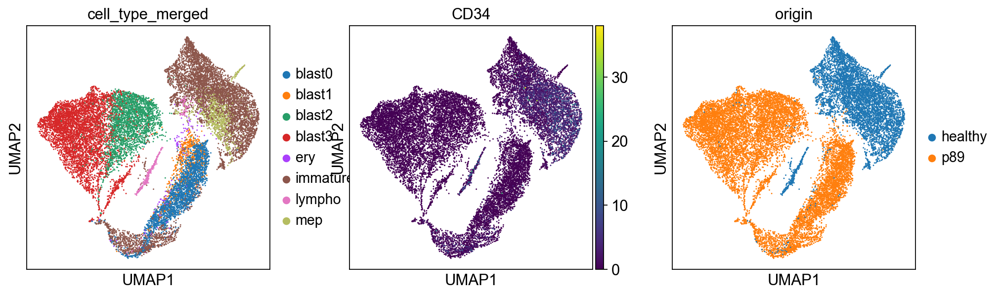

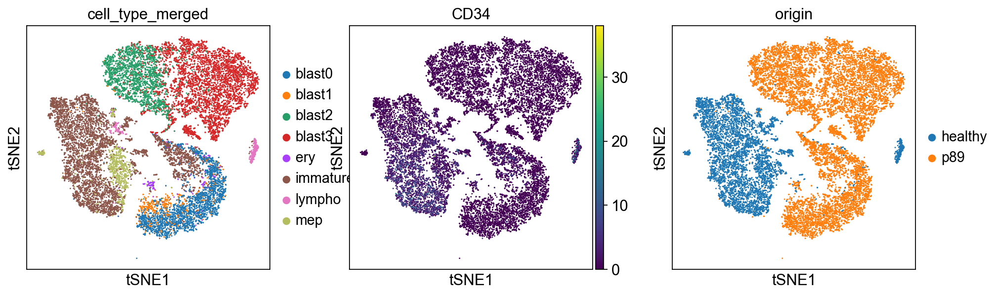

In [6]:
sc.pl.umap(adata, color=['cell_type_merged', 'CD34', 'origin'])
sc.pl.tsne(adata, color=['cell_type_merged', 'CD34', 'origin'])


### ForceAtlas2

In [5]:
sc.pp.neighbors(
    adata,
    n_neighbors=10,
#     n_pcs=None,
#     use_rep=None,
    knn=True,
    random_state=0,
#     method="umap",
    metric="euclidean",
    metric_kwds={},
    copy=False,
)

In [7]:
sc.tl.draw_graph(adata, layout='fa')

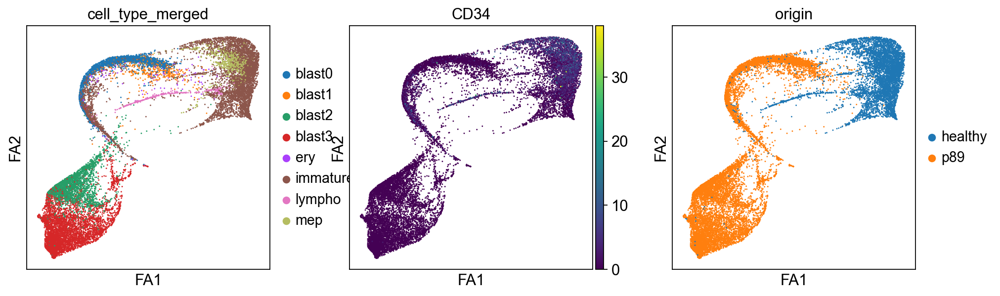

In [8]:
sc.pl.draw_graph(adata, layout='fa', color=['cell_type_merged', 'CD34', 'origin'])

In [9]:
adata.write('outputs/force_atlas2.h5ad')

### Scanorama

In [17]:
adata = get_fresh_data()
adata_healthy = adata[adata.obs['origin'] == "healthy", :]
adata_p89 = adata[adata.obs['origin'] == "p89", :]
adatas = [adata_healthy, adata_p89]


scanorama.integrate_scanpy(adatas)
corrected_scanorama = scanorama.correct_scanpy(adatas)
corrected_scanorama = corrected_scanorama[0].concatenate(corrected_scanorama[1])


Found 3130 genes among all datasets
[[0.    0.368]
 [0.    0.   ]]
Processing datasets (0, 1)
Found 3130 genes among all datasets
[[0.    0.368]
 [0.    0.   ]]
Processing datasets (0, 1)


In [18]:
corrected_scanorama.write('outputs-achille/scanorama.h5ad')

/opt/miniconda3/envs/latent-manifold/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'NPM1_mut' as categorical
/opt/miniconda3/envs/latent-manifold/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'NPM1_wt' as categorical
/opt/miniconda3/envs/latent-manifold/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and w

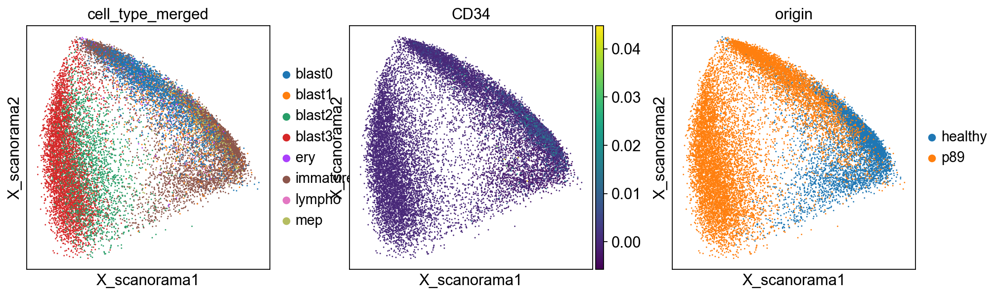

In [19]:
sc.pl.embedding(corrected_scanorama, basis="X_scanorama", color=["cell_type_merged", "CD34", "origin"])

<Figure size 320x320 with 0 Axes>

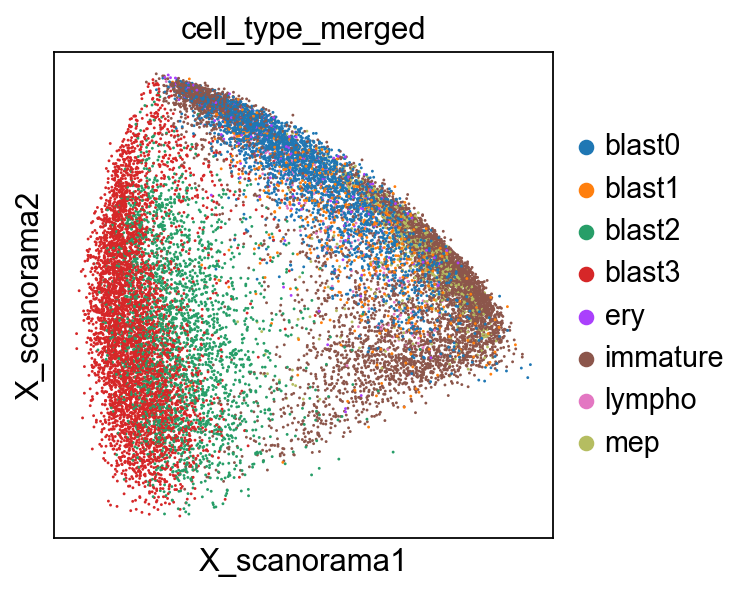

<Figure size 320x320 with 0 Axes>

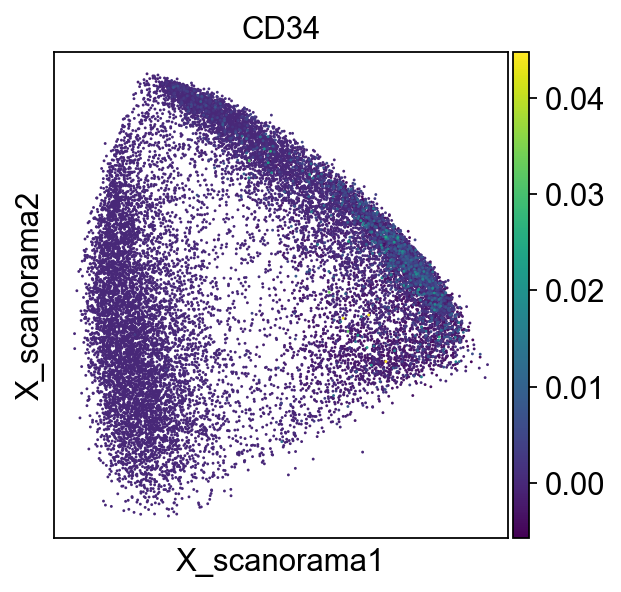

<Figure size 320x320 with 0 Axes>

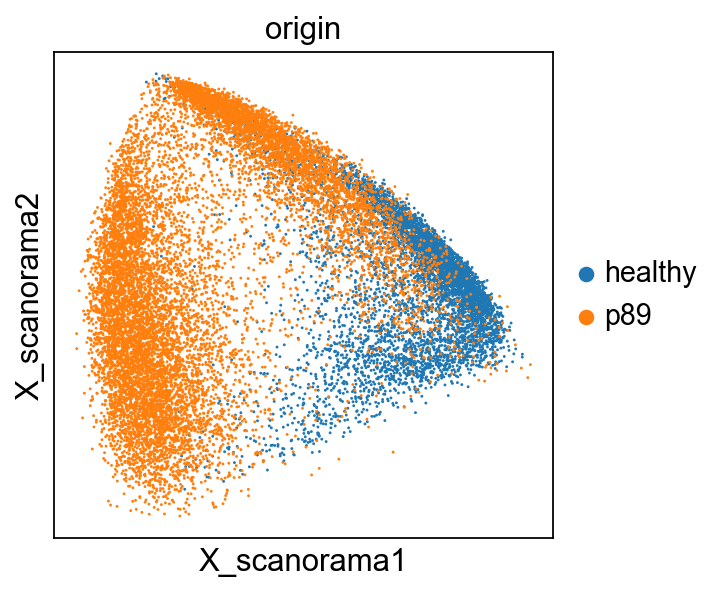

In [20]:
plt.figure()
sc.pl.embedding(corrected_scanorama, basis="X_scanorama", color=["cell_type_merged"])

plt.figure()
sc.pl.embedding(corrected_scanorama, basis="X_scanorama", color=["CD34"])

plt.figure()
sc.pl.embedding(corrected_scanorama, basis="X_scanorama", color=["origin"])


### Phate

In [3]:
import phate


In [23]:
import phate
adata = get_fresh_data()
phate_op = phate.PHATE(n_components = 31)
data_phate = phate_op.fit_transform(adata)

del adata.obsm
adata.obsm['phate'] = data_phate
adata.write('outputs-achille/phate.h5ad')

Calculating PHATE...
  Running PHATE on 18000 observations and 3130 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 5.42 seconds.
    Calculating KNN search...
    Calculated KNN search in 26.84 seconds.
    Calculating affinities...
    Calculated affinities in 0.87 seconds.
  Calculated graph and diffusion operator in 33.17 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 1.10 seconds.
    Calculating KMeans...
    Calculated KMeans in 14.45 seconds.
  Calculated landmark operator in 16.92 seconds.
  Calculating optimal t...
    Automatically selected t = 45
  Calculated optimal t in 2.76 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.67 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 221.20 seconds.
Calculated PHATE in 274.74 seconds.


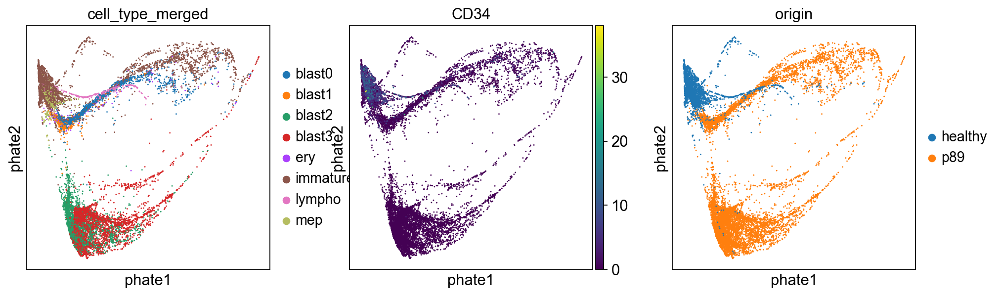

In [24]:
sc.pl.embedding(adata, basis="phate", color=["cell_type_merged", "CD34", "origin"])

<Figure size 320x320 with 0 Axes>

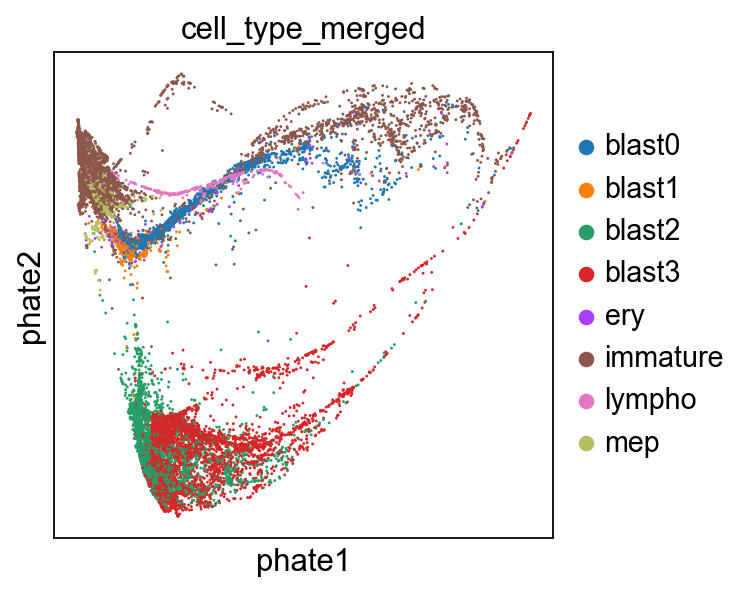

<Figure size 320x320 with 0 Axes>

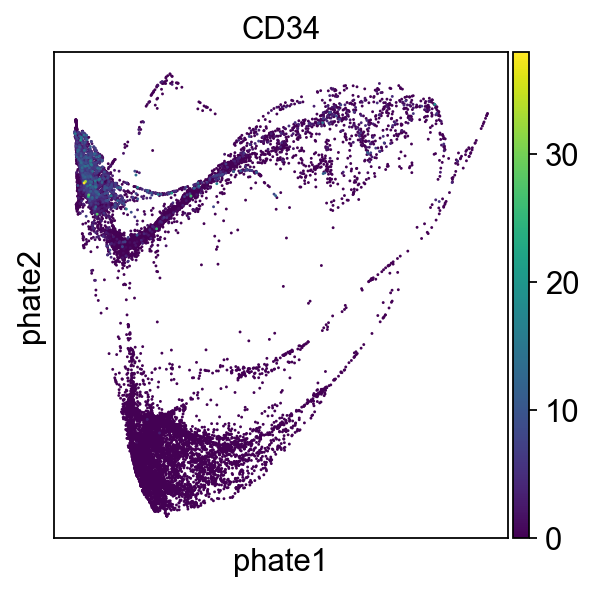

<Figure size 320x320 with 0 Axes>

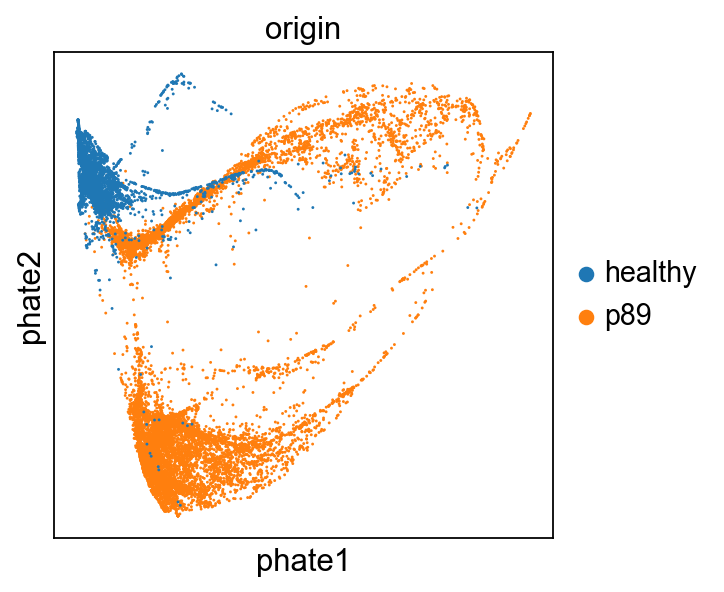

In [25]:
plt.figure()
sc.pl.embedding(adata, basis="phate", color=["cell_type_merged"])

plt.figure()
sc.pl.embedding(adata, basis="phate", color=["CD34"])

plt.figure()
sc.pl.embedding(adata, basis="phate", color=["origin"])


### Harmony

In [28]:
import scanpy.external as sce

adata = get_fresh_data()
sc.tl.pca(adata)
sce.pp.harmony_integrate(adata, 'origin')
sc.pp.neighbors(adata, use_rep="X_pca_harmony")
sc.tl.umap(adata)

adata.write('outputs-achille/harmony.h5ad')

computing PCA
    with n_comps=50
    finished (0:00:05)


2023-02-02 11:15:07,003 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2023-02-02 11:15:21,727 - harmonypy - INFO - sklearn.KMeans initialization complete.
2023-02-02 11:15:21,866 - harmonypy - INFO - Iteration 1 of 10
2023-02-02 11:15:27,408 - harmonypy - INFO - Iteration 2 of 10
2023-02-02 11:15:32,108 - harmonypy - INFO - Iteration 3 of 10
2023-02-02 11:15:37,019 - harmonypy - INFO - Iteration 4 of 10
2023-02-02 11:15:44,678 - harmonypy - INFO - Converged after 4 iterations


In [ ]:
# adata.obsm["X_pca"]

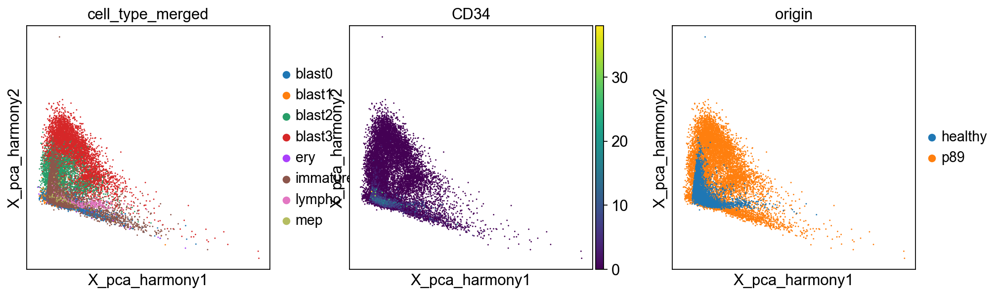

In [29]:
sc.pl.embedding(adata, basis="X_pca_harmony", color=["cell_type_merged", "CD34", "origin"])

<Figure size 320x320 with 0 Axes>

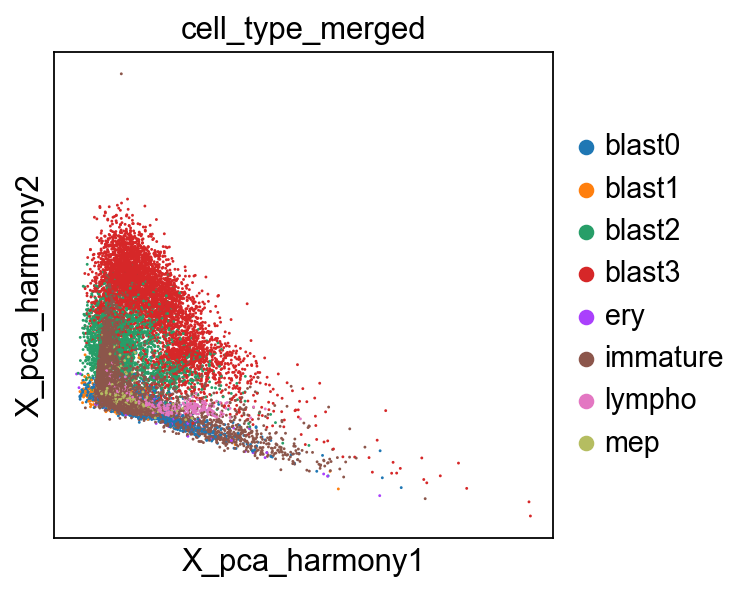

<Figure size 320x320 with 0 Axes>

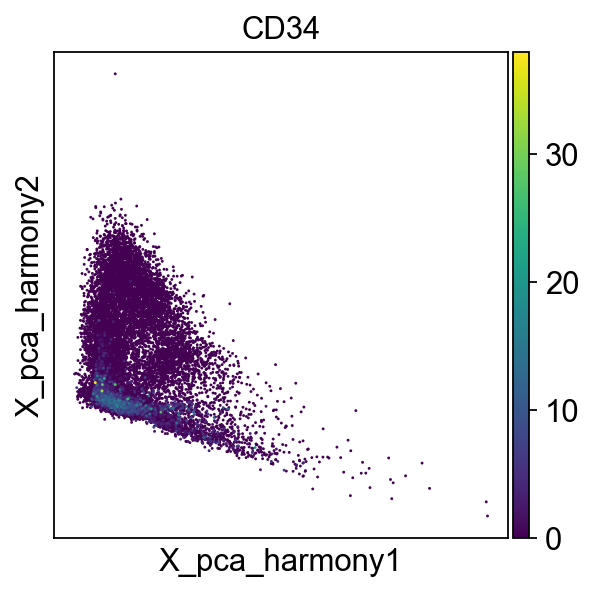

<Figure size 320x320 with 0 Axes>

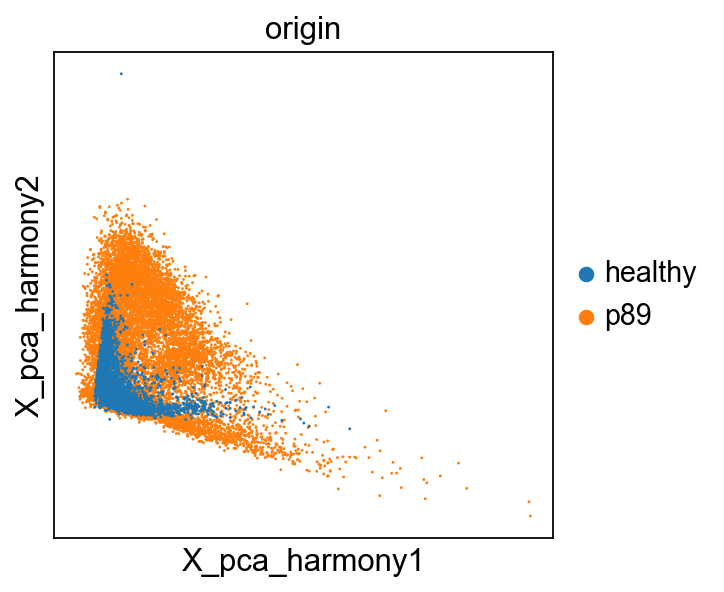

In [30]:
plt.figure()
sc.pl.embedding(adata, basis="X_pca_harmony", color=["cell_type_merged"])

plt.figure()
sc.pl.embedding(adata, basis="X_pca_harmony", color=["CD34"])

plt.figure()
sc.pl.embedding(adata, basis="X_pca_harmony", color=["origin"])


### scVI

In [2]:
import scvi

In [31]:
import scvi

adata = get_fresh_data()
del adata.obsm

scvi.data.setup_anndata(adata, batch_key="sample")
vae = scvi.model.SCVI(adata, n_layers=2, n_latent=10)
vae.train()

adata.obsm["X_scVI"] = vae.get_latent_representation()


INFO     Using batches from adata.obs["sample"]                                              
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.X                                                             
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 18000 cells, 3130 vars, 2 batches,
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


GPU available: False, used: False
TPU available: False, using: 0 TPU cores


Epoch 400/400: 100%|██████████| 400/400 [50:01<00:00,  7.50s/it, loss=3.22e+03, v_num=1]


In [35]:
vae.save('outputs-achille/scvi_model_10_FINAL.weights')
sc.pp.neighbors(adata, use_rep="X_scVI")
sc.tl.umap(adata)
adata.write('outputs-achille/scvi.h5ad')

In [9]:
adata = sc.read_h5ad("outputs-achille/scvi.h5ad")

sc.pp.neighbors(
    adata,
    n_neighbors=10,
    knn=True,
    random_state=0,
    use_rep="X_scVI",
)
sc.tl.umap(adata)


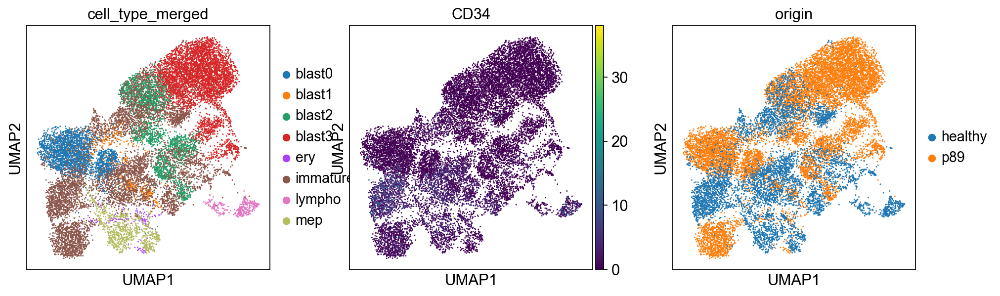

In [12]:
sc.pl.umap(adata, color=["cell_type_merged", "CD34", "origin"])

In [4]:
adata = get_fresh_data()

scvi.data.setup_anndata(adata,)
vae_no = scvi.model.SCVI(adata, n_layers=2, n_latent=10)
vae_no.train()

adata.obsm["X_scVI_noeffects"] = vae_no.get_latent_representation()
# adata.write('outputs-achille/scvi_no_effects.h5ad')


INFO     No batch_key inputted, assuming all cells are same batch                            
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.X                                                             
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 18000 cells, 3130 vars, 1 batches,
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


GPU available: False, used: False
TPU available: False, using: 0 TPU cores


Epoch 400/400: 100%|██████████| 400/400 [52:15<00:00,  7.84s/it, loss=3.21e+03, v_num=1]


In [4]:
for batch_key in ["sample"]:
    for n_layers in [1, 2]:
        adata = get_fresh_data()
        scvi.data.setup_anndata(adata, batch_key=batch_key)
        vae_no = scvi.model.SCVI(adata, n_layers=n_layers, n_latent=10)
        vae_no.train()
        adata.obsm["X_scVI_noeffects"] = vae_no.get_latent_representation()
        file_name = f"scvi.{'batch' if batch_key is not None else 'nobatch'}.{'linear' if n_layers==1 else 'nonlinear'}"
        adata.write(f"outputs-achille/"+file_name+".h5ad")
        vae_no.save(f"outputs-achille/"+file_name)

INFO     Using batches from adata.obs["sample"]                                              
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.X                                                             
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 18000 cells, 3130 vars, 2 batches,
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


GPU available: False, used: False
TPU available: False, using: 0 TPU cores


Epoch 400/400: 100%|██████████| 400/400 [49:44<00:00,  7.46s/it, loss=3.23e+03, v_num=1]
INFO     Using batches from adata.obs["sample"]                                              
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.X                                                             
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 18000 cells, 3130 vars, 2 batches,
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


GPU available: False, used: False
TPU available: False, using: 0 TPU cores


Epoch 400/400: 100%|██████████| 400/400 [49:13<00:00,  7.38s/it, loss=3.2e+03, v_num=1] 


In [19]:
sc.pp.neighbors(
    adata,
    n_neighbors=15,
    knn=True,
    random_state=0,
    use_rep="X_scVI_noeffects",
)


In [20]:
sc.tl.umap(adata)


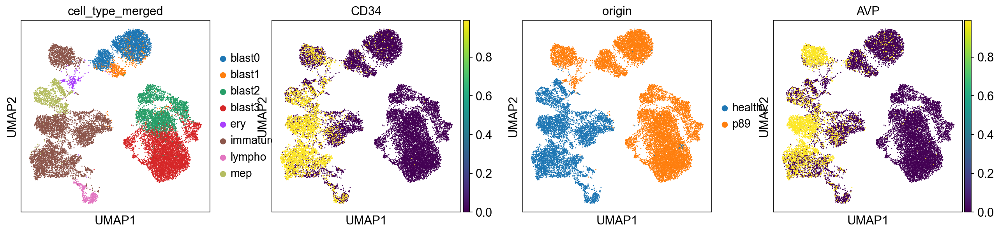

In [25]:
sc.pl.umap(adata, color=["cell_type_merged", "CD34", "origin", "AVP"], vmax=0.99)

In [22]:
for i in range(10):
    adata.obs[f"z{i}"] = adata.obsm["X_scVI_noeffects"][:,i]

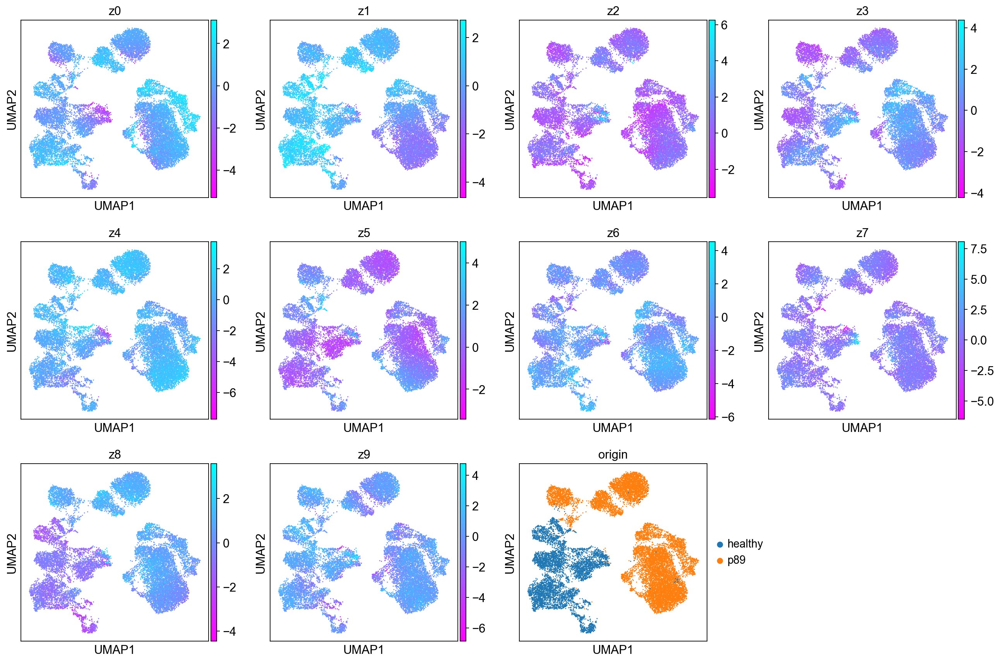

In [23]:
sc.pl.umap(adata, color=[f"z{i}" for i in range(10)] + ["origin"],color_map="cool_r",)

In [8]:
vae_no.save("scvi_nobatch_effect.pth")

In [6]:
adata.obsm["X_scVI_noeffects"]

array([[-0.13767426,  0.46290436,  0.70719796, ...,  0.06093985,
         1.0613515 , -0.09973547],
       [ 0.77868646, -0.63247436, -0.548235  , ..., -0.45968252,
         0.1288533 , -0.3198399 ],
       [ 1.5348204 , -1.0442116 ,  1.5823252 , ..., -0.24192488,
         0.33776113, -0.02592567],
       ...,
       [-1.3499563 ,  0.94466335,  0.11305687, ..., -0.54752535,
        -0.55240655,  0.2704274 ],
       [-0.17262027, -0.6172108 , -0.28972855, ...,  0.44843704,
        -1.3150043 ,  0.44315228],
       [-1.0188203 , -0.38517827,  0.01606578, ...,  0.03575462,
        -1.2304062 ,  0.6368874 ]], dtype=float32)

In [2]:
import scanpy as sc

In [3]:
adata = sc.read_h5ad('outputs-achille/scvi_no_effects.h5ad')
sc.pp.neighbors(
    adata,
    n_neighbors=10,
    knn=True,
    random_state=0,
    use_rep="X_scVI_noeffects",
)
sc.tl.umap(adata)



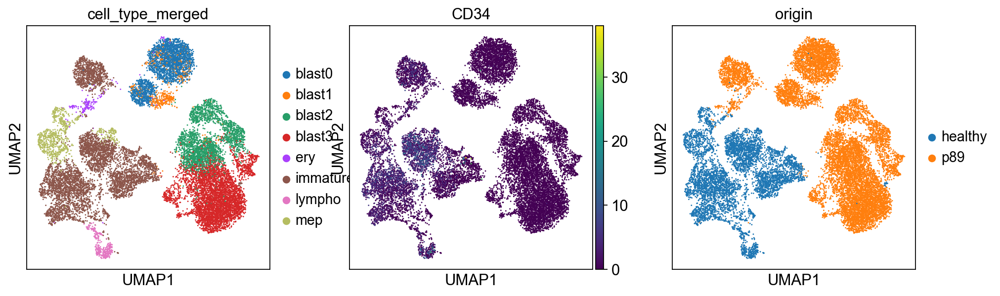

In [16]:
sc.pl.umap(adata, color=["cell_type_merged", "CD34", "origin"])

In [6]:
import numpy as np

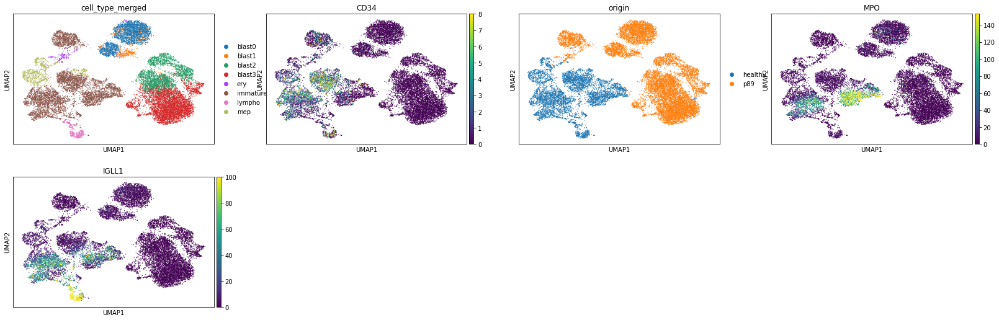

In [10]:
sc.pl.umap(adata, color=["cell_type_merged", "CD34", "origin", "MPO", "IGLL1"], vmax=lambda x: np.quantile(x,0.99))